# Task 1 Basics

In [1]:
import random
random.seed(42)

 The goal is to attack a ResNet-34 model that is trained to classify the ImageNet-1K
 dataset. ImageNet-1K is a well-known dataset in computer vision research with visually
 challenging images from 1000 classes, and networks which are trained on ImageNet
 typically also do well on other tasks. You can download the ResNet-34 model from
 TorchVision using the following command:

In [2]:
import torch
import torchvision
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 166MB/s]


In [3]:
!ls

sample_data


Download the attached test dataset. This is a subset of images taken from 100 classes of
 the ImageNet-1K dataset. The included .json file has the associated label names and
 ImageNet label indices. We will need to preprocess the images like this before doing
 anything else

In [7]:
!unzip TestDataSet.zip

Archive:  TestDataSet.zip
   creating: TestDataSet/
   creating: TestDataSet/n02795169/
  inflating: __MACOSX/TestDataSet/._n02795169  
   creating: TestDataSet/n02769748/
  inflating: __MACOSX/TestDataSet/._n02769748  
   creating: TestDataSet/n02834397/
  inflating: __MACOSX/TestDataSet/._n02834397  
   creating: TestDataSet/n02917067/
  inflating: __MACOSX/TestDataSet/._n02917067  
   creating: TestDataSet/n02808304/
  inflating: __MACOSX/TestDataSet/._n02808304  
   creating: TestDataSet/n03016953/
  inflating: __MACOSX/TestDataSet/._n03016953  
   creating: TestDataSet/n02793495/
  inflating: __MACOSX/TestDataSet/._n02793495  
   creating: TestDataSet/n02814533/
  inflating: __MACOSX/TestDataSet/._n02814533  
   creating: TestDataSet/n02837789/
  inflating: __MACOSX/TestDataSet/._n02837789  
   creating: TestDataSet/n02840245/
  inflating: __MACOSX/TestDataSet/._n02840245  
   creating: TestDataSet/n02992211/
  inflating: __MACOSX/TestDataSet/._n02992211  
   creating: TestDataSet

In [8]:
import json
with open('TestDataSet/labels_list.json', 'r') as f:
    label_list = json.load(f)
labels = {int(item.split(":")[0]): item.split(":")[1].strip() for item in label_list}


for k in list(labels.keys())[:5]:
    print(k, ":", labels[k])


401 : accordion
402 : acoustic guitar
403 : aircraft carrier
404 : airliner
405 : airship


In [9]:
 import numpy as np
 import torchvision.transforms as transforms
 mean_norms = np.array([0.485, 0.456, 0.406])
 std_norms = np.array([0.229, 0.224, 0.225])
 plain_transforms = transforms.Compose([
 transforms.ToTensor(),
 transforms.Normalize(mean=mean_norms,
 std=std_norms)
 ])
 dataset_path = "./TestDataSet"
 dataset = torchvision.datasets.ImageFolder(root=dataset_path,transform=plain_transforms)
 print(dataset)

Dataset ImageFolder
    Number of datapoints: 500
    Root location: ./TestDataSet
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.485 0.456 0.406], std=[0.229 0.224 0.225])
           )


 Evaluate the pre-trained ResNet-34 model on this test dataset; note that to validate
 a prediction you will have to look at the predicted class label and match it to the
 corresponding index in the .json file

In [10]:
device='cuda' if torch.cuda.is_available() else 'cpu'
pretrained_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [11]:
from torch.utils.data import DataLoader
from tqdm import tqdm
pretrained_model.eval()
test_loader = DataLoader(dataset, batch_size=1, shuffle=False)
correct_predictions = 0
correct_predictions_top5 = 0
total_samples = 0

out_string=''
with torch.no_grad():
    for images, labels_idx in tqdm(test_loader,desc="Evaluating"):
        images = images.to(next(pretrained_model.parameters()).device)
        outputs = pretrained_model(images)
        _, predicted_label = torch.max(outputs, 1)
        _, t5_predicted_labels = torch.topk(outputs, 5, dim=1)
        predicted_label = predicted_label.item()
        actual_label_idx = labels_idx[0].item()+401
        if predicted_label == actual_label_idx:
            correct_predictions += 1
        if actual_label_idx in t5_predicted_labels[0]:
            correct_predictions_top5 += 1
        total_samples += 1

Evaluating: 100%|██████████| 500/500 [00:04<00:00, 105.46it/s]


Report top-1 and top-5 accuracy for this dataset. (Top-k accuracy is calculated as
 follows: compute the k most likely class labels according to the classifier, and return
 True if any of these k labels matches the ground truth.

In [12]:
accuracy = (correct_predictions / total_samples) * 100
s0=f"Top-1 Accuracy of the ResNet-34 model on the test dataset: {accuracy:.2f}%"
t5_acc=(correct_predictions_top5 / total_samples) * 100
s0+=f"\nTop-5 Accuracy of the ResNet-34 model on the test dataset: {t5_acc:.2f}%"
print(s0)

Top-1 Accuracy of the ResNet-34 model on the test dataset: 76.00%
Top-5 Accuracy of the ResNet-34 model on the test dataset: 94.20%


# Task 2: Pixel-wise attacks

 Acommon and simple algorithm for mounting an L∞ attack is called Fast Gradient
 Sign Method (FGSM); this implements a single step of gradient ascent (in pixel space)
 and truncates the values of the gradients to at most ε. Mathematically, we can write this
 as
 x ←x+εsign(∇xL)
 where L is the cross-entropy loss, the gradient is with respect to the input parameters
 (not the weights– so remember to ), and the sign operation just truncates the gradient to
 the unit L∞ cube. (Convince yourself that this makes sense!)
 The parameter ε is called the attack budget. If raw (unpreprocessed) images have pixel
 values of 0-255, an attack budget of ε = 0.02 roughly corresponds to changing each
 pixel value in the raw image by at most +/-1

In [13]:
import tensorflow as tf
import matplotlib.pyplot as plt

EPSILON=0.02
SAVE_DIR="AdversarialTestSet"

Implement FGSM for each image in the test dataset for ε = 0.02. Visualize 3 to 5 test
 cases where the original model no longer classifies as expected. Your visualization can
 be similar to the example shown above

In [14]:
import torch
import torch.nn.functional as F
from torchvision.utils import save_image
import os
from tqdm import tqdm

def unnormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    mean = torch.tensor(mean).view(3, 1, 1).to(tensor.device)
    std = torch.tensor(std).view(3, 1, 1).to(tensor.device)
    return torch.clamp(tensor * std + mean, 0, 1)

def fgsm_attack(model, dataloader, epsilon=0.02, save_dir="AdversarialTestSet1", device='cuda'):
    model.eval()
    os.makedirs(save_dir, exist_ok=True)
    origin_images = []
    adv_images = []
    true_labels = []
    total_samples = 0
    correct_predictions = 0
    correct_predictions_top5 = 0
    for idx, (images, labels) in tqdm(enumerate(dataloader),total=500, desc="Generating"):
        images, labels = images.to(device), labels.to(device)
        labels += 401
        images.requires_grad = True
        outputs = model(images)
        loss = F.cross_entropy(outputs, labels)
        model.zero_grad()
        loss.backward()
        # FGSM without clamp
        grad_sign = images.grad.data.sign()
        perturbed_images = images + epsilon * grad_sign
        # checking L∞ restriction
        max_diff = (perturbed_images - images).abs().view(images.size(0), -1).max(dim=1)[0]
        for i, diff in enumerate(max_diff):
            if diff.item() > epsilon + 1e-6:
                print(f"[Warning] Image {idx}_{i} exceeded ε: {diff.item():.4f}")
        with torch.no_grad():
          output = model(perturbed_images)
          _, predicted_label = torch.max(output, 1)
          _, top5 = torch.topk(output, 5, dim=1)

          correct_predictions += (predicted_label == labels).sum().item()
          correct_predictions_top5 += (top5 == labels.unsqueeze(1)).any(dim=1).sum().item()
          total_samples += labels.size(0)
        # save pic
        for i in range(perturbed_images.size(0)):
            label_name = str(labels[i].item())
            save_subdir = os.path.join(save_dir, label_name)
            os.makedirs(save_subdir, exist_ok=True)

            save_path = os.path.join(save_subdir, f"adv_{idx}_{i}.png")
            adv_to_save = unnormalize(perturbed_images[i])
            save_image(adv_to_save, save_path)
        origin_images.append(images.detach().cpu())
        adv_images.append(perturbed_images.detach().cpu())
        true_labels.append(labels.detach().cpu())
    accuracy = (correct_predictions / total_samples) * 100
    accuracy_top5 = (correct_predictions_top5 / total_samples) * 100
    s1=f"\nTop-1 Accuracy of ResNet-34 on adversarial dataset: {accuracy:.2f}%"
    s1+=f"\nTop-5 Accuracy of ResNet-34 on adversarial dataset: {accuracy_top5:.2f}%"
    print(s1)
    return origin_images, adv_images, true_labels


 You should now have a new set of 500 images; verify that the new images are visually
 similar to the original test set and that the L∞ distance between new and original is no
 greater than ε = 0.02. Save this dataset (call this “Adversarial Test Set 1”). Evaluate
 ResNet-34 performance and report new top-1 and top-5 accuracy scores. You should
 strive to achieve accuracy drop of at least 50% relative to your baseline numbers from
 Task 1 (so if your earlier metrics were above 80%, then your new metrics should be
 below 30%.)

In [15]:
origin_images, adv_images, true_labels = fgsm_attack(pretrained_model, test_loader, epsilon=0.02)


Generating: 100%|██████████| 500/500 [00:22<00:00, 21.75it/s]


Top-1 Accuracy of ResNet-34 on adversarial dataset: 6.00%
Top-5 Accuracy of ResNet-34 on adversarial dataset: 35.60%


Implement FGSM for each image in the test dataset for ε = 0.02. Visualize 3 to 5 test
 cases where the original model no longer classifies as expected. Your visualization can
 be similar to the example shown above.

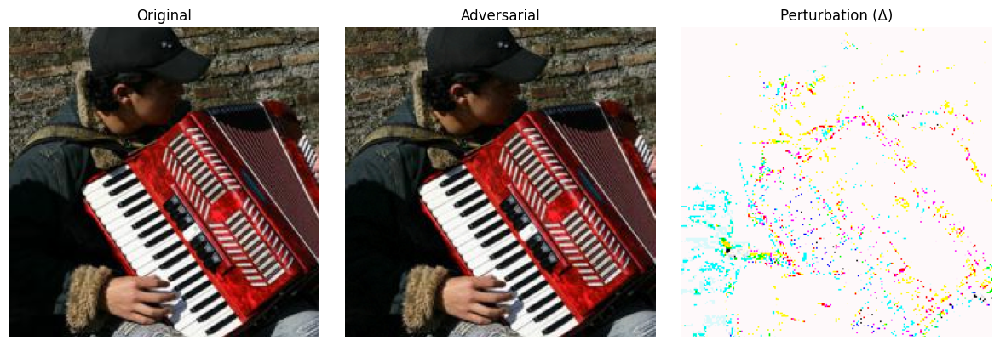

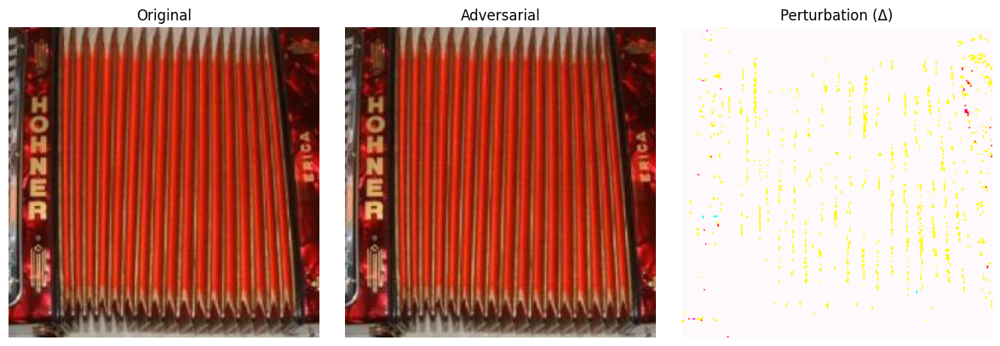

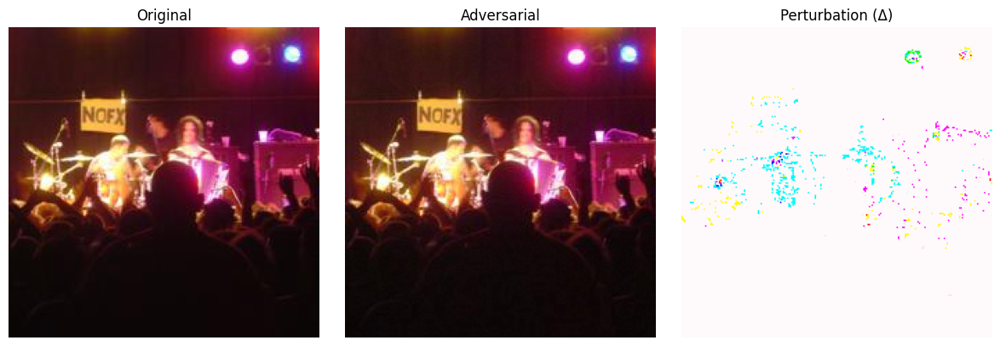

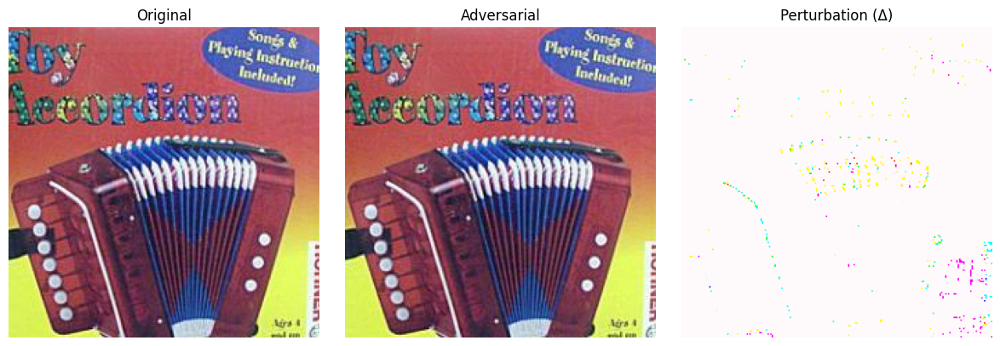

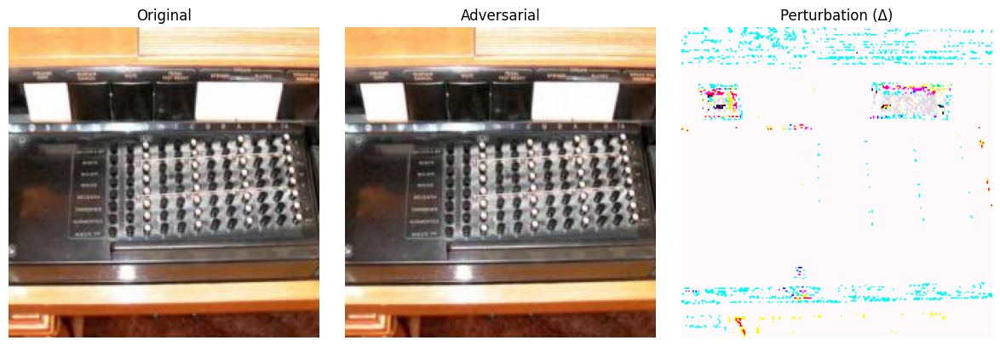

In [21]:
import matplotlib.pyplot as plt
import numpy as np


import matplotlib.pyplot as plt
import numpy as np
import torch

def visualize_five_comparisons(origin_batches, adv_batches, index_range=5):

    shown = 0
    for batch_orig, batch_adv in zip(origin_batches, adv_batches):
        for i in range(batch_orig.size(0)):
            if shown >= index_range:
                return

            # Unnormalize images to original pixel scale [0,1]
            orig = unnormalize(batch_orig[i].cpu())
            adv = unnormalize(batch_adv[i].cpu())

            # Compute perturbation and normalize for visualization
            diff = torch.abs(adv - orig)
            diff = (diff - diff.min()) / (diff.max() - diff.min() + 1e-8)

            # Create a side-by-side plot
            fig, axs = plt.subplots(1, 3, figsize=(12, 4))

            axs[0].imshow(np.transpose(orig.numpy(), (1, 2, 0)))
            axs[0].set_title("Original")
            axs[0].axis('off')

            axs[1].imshow(np.transpose(adv.numpy(), (1, 2, 0)))
            axs[1].set_title("Adversarial")
            axs[1].axis('off')

            axs[2].imshow(np.transpose(diff.numpy(), (1, 2, 0)))
            axs[2].set_title("Perturbation (Δ)")
            axs[2].axis('off')

            plt.tight_layout()
            plt.show()
            shown += 1

visualize_five_comparisons(origin_images, adv_images, index_range=5)


# Task 3: Improved attacks

Nowthat you have two accuracy metrics (one for the original test set, Adversarial Test
 Set 1), propose ways to improve your attack and degrade performance even further.
 Remember: you can do whatever you like to the original test images, as long as the ε
 constraint is met and you get worse performance than FGSM. Options include: multiple
 gradient steps, targeted attacks, other optimizers, etc

## GRADCAM+FGSM

In [22]:
save_dir = "AdversarialTestSet2"
os.makedirs(save_dir, exist_ok=True)

In [24]:
import torch
import torch.nn.functional as F
from torchvision.utils import save_image
import torch.nn as nn
import torchvision
from torchvision import transforms
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
import numpy as np

# Global Cache Grad-CAM
gradients = []
activations = []

# Unnormalize [0, 1]
def unnormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    mean = torch.tensor(mean).view(1, 3, 1, 1).to(tensor.device)
    std = torch.tensor(std).view(1, 3, 1, 1).to(tensor.device)
    return torch.clamp(tensor * std + mean, 0, 1)


In [28]:
def GradCAM_FGSM(model, dataloader, epsilon=0.02, save_dir="AdversarialTestSet2", device='cuda'):
    model.eval()
    os.makedirs(save_dir, exist_ok=True)

    total_samples = 0
    correct_predictions = 0
    correct_predictions_top5 = 0

    origin_images = []
    adv_images = []
    true_labels = []
    cam_list = []
    max_epsilons = []

    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    mean_tensor = torch.tensor(mean).view(1, 3, 1, 1).to(device)
    std_tensor = torch.tensor(std).view(1, 3, 1, 1).to(device)

    for idx, (images, labels) in tqdm(enumerate(dataloader), total=len(dataloader), desc="GradCAM-FGSM"):
        images, labels = images.to(device), labels.to(device)
        labels += 401
        images.requires_grad = True

        gradients.clear()
        activations.clear()

        # Register hooks
        def forward_hook(module, input, output):
            activations.append(output)

        def full_backward_hook(module, grad_input, grad_output):
            gradients.append(grad_output[0])

        handle_fwd = model.layer4[1].conv2.register_forward_hook(forward_hook)
        handle_bwd = model.layer4[1].conv2.register_full_backward_hook(full_backward_hook)

        # Forward & Backward
        output = model(images)
        loss = F.cross_entropy(output, labels)
        model.zero_grad()
        loss.backward()

        handle_fwd.remove()
        handle_bwd.remove()

        # Grad-CAM
        grad = gradients[0]
        act = activations[0]
        weights = torch.mean(grad, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * act, dim=1, keepdim=True)
        cam = F.relu(cam)
        cam_min = cam.view(cam.shape[0], -1).min(dim=1)[0].view(-1, 1, 1, 1)
        cam_max = cam.view(cam.shape[0], -1).max(dim=1)[0].view(-1, 1, 1, 1)
        cam = (cam - cam_min) / (cam_max - cam_min + 1e-6)
        cam = F.interpolate(cam, size=(224, 224), mode='bilinear', align_corners=False)
        cam_list.append(cam.detach().cpu())

        # Dynamic Perturbation Weights (Attention-weighted)
        weight = 1.0 + cam  # ∈ [1.0, 2.0]
        weight = weight / weight.view(images.size(0), -1).mean(dim=1).view(-1, 1, 1, 1)  # Keep overall perturbation strength constant

        # Unnormalize for perturbation
        unnorm_images = unnormalize(images.clone(), mean, std)
        grad = images.grad.data.clone()
        for c in range(3):
            grad[:, c, :, :] = grad[:, c, :, :] / std[c]
        sign_grad = grad.sign()

        # Attention-weighted Perturbation (with L∞ Projection Constraint)
        perturbation = sign_grad * weight
        perturbation = perturbation / perturbation.view(images.size(0), -1).abs().max(dim=1)[0].view(-1, 1, 1, 1)  # Normalize to max=1
        perturbation = perturbation * epsilon  # Rescale back to ε
        perturbation = torch.clamp(perturbation, -epsilon, epsilon)  # Strictly limit perturbation range

        perturbed_unnorm = unnorm_images + perturbation
        perturbed_unnorm = torch.clamp(perturbed_unnorm, 0, 1)
        perturbed_images = (perturbed_unnorm - mean_tensor) / std_tensor

        # Check Perturbation Magnitude
        diff = (perturbed_unnorm - unnorm_images).abs().view(images.size(0), -1)
        batch_max_eps = diff.max(dim=1)[0].tolist()
        max_epsilons.extend(batch_max_eps)

        for i, eps in enumerate(batch_max_eps):
            if eps > epsilon + 1e-6:
                print(f"[Warning] Image {idx}_{i} exceeded ε: {eps:.5f}")

        # Model Evaluation
        with torch.no_grad():
            output_adv = model(perturbed_images)
            _, pred = torch.max(output_adv, 1)
            _, top5 = torch.topk(output_adv, 5, dim=1)
            correct_predictions += (pred == labels).sum().item()
            correct_predictions_top5 += (top5 == labels.unsqueeze(1)).any(dim=1).sum().item()
            total_samples += labels.size(0)

        # Save Perturbation Map
        for i in range(perturbed_unnorm.size(0)):
            label_name = str(labels[i].item())
            save_subdir = os.path.join(save_dir, label_name)
            os.makedirs(save_subdir, exist_ok=True)
            save_path = os.path.join(save_subdir, f"adv_{idx}_{i}.png")
            save_image(perturbed_unnorm[i].detach().cpu(), save_path)

        origin_images.append(unnorm_images.detach().cpu())
        adv_images.append(perturbed_unnorm.detach().cpu())
        true_labels.append(labels.detach().cpu())

    # Overall Perturbation Information
    print(f"\n[GradCAM-FGSM] Top-1 Accuracy: {(correct_predictions / total_samples) * 100:.2f}%")
    print(f"[GradCAM-FGSM] Top-5 Accuracy: {(correct_predictions_top5 / total_samples) * 100:.2f}%")
    print(f"[Epsilon Info] Max pixel perturbation: {max(max_epsilons):.5f}")
    print(f"[Epsilon Info] Mean perturbation: {sum(max_epsilons)/len(max_epsilons):.5f}")

    return origin_images, adv_images, true_labels, cam_list


In [34]:
def visualize_adversarial_examples(orig_list, adv_list, cam_list, save_path="adv_comparison.png"):
    num_images = min(5, len(orig_list))  # Display up to 5 examples
    fig, axes = plt.subplots(num_images, 4, figsize=(16, 3 * num_images))

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    for i in range(num_images):
        # Keep original and adversarial as-is (normalized)
        orig = orig_list[i][0].permute(1, 2, 0).numpy()
        adv = adv_list[i][0].permute(1, 2, 0).numpy()

        # Compute difference on denormalized images
        orig_denorm = orig * std + mean
        adv_denorm = adv * std + mean
        diff = np.abs(adv_denorm - orig_denorm)
        diff = diff / diff.max() if diff.max() > 0 else diff

        cam = cam_list[i][0].squeeze().numpy()
        cam_color = plt.cm.jet(cam)[..., :3]

        for ax in axes[i] if num_images > 1 else axes:
            ax.axis("off")

        axes[i][0].imshow(orig)
        axes[i][0].set_title("Original")

        axes[i][1].imshow(adv)
        axes[i][1].set_title("Adversarial")

        axes[i][2].imshow(diff)
        axes[i][2].set_title("Difference")

        axes[i][3].imshow(cam_color)
        axes[i][3].set_title("Grad-CAM")

    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()


GradCAM-FGSM: 100%|██████████| 500/500 [00:21<00:00, 23.55it/s]



[GradCAM-FGSM] Top-1 Accuracy: 3.40%
[GradCAM-FGSM] Top-5 Accuracy: 22.80%
[Epsilon Info] Max pixel perturbation: 0.02000
[Epsilon Info] Mean perturbation: 0.02000


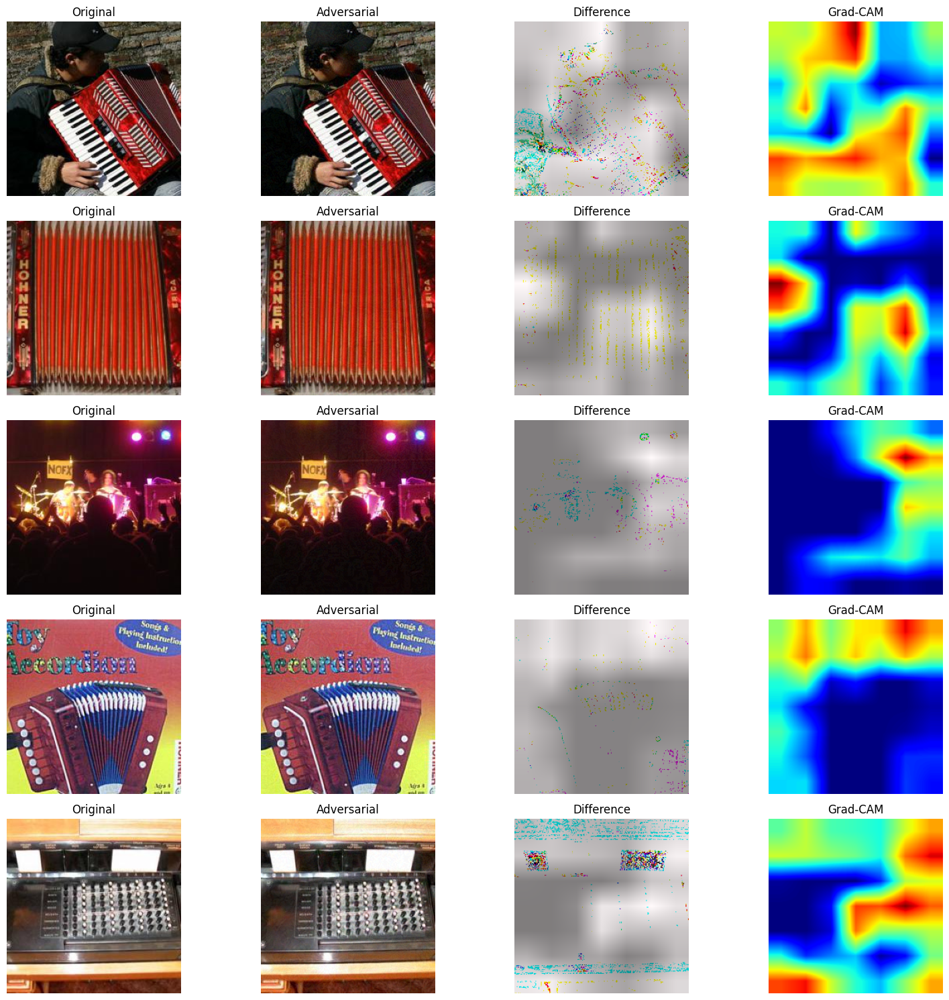

In [36]:
origin_images, adv_images, true_labels, cam_list = GradCAM_FGSM(pretrained_model, test_loader, epsilon=0.02, device=device)

# Display image comparisons
visualize_adversarial_examples(origin_images, adv_images, cam_list)


## PGD+GRADCAM

In [37]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import os

# GradCAM caches
gradients = []
activations = []

# Restore normalized image tensor to [0,1] range for visualization
def unnormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    mean = torch.tensor(mean).view(1, 3, 1, 1).to(tensor.device)
    std = torch.tensor(std).view(1, 3, 1, 1).to(tensor.device)
    return torch.clamp(tensor * std + mean, 0, 1)


In [57]:
def PGD_GradCAM_Attack(model, dataloader, epsilon=0.02, alpha=0.005, steps=10, save_dir="PGD_GradCAM_Strongest", device='cuda'):
    model.eval()
    os.makedirs(save_dir, exist_ok=True)

    total_samples = 0
    correct_predictions = 0
    correct_predictions_top5 = 0

    origin_images = []
    adv_images = []
    true_labels = []
    cam_list = []
    max_epsilons = []

    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    mean_tensor = torch.tensor(mean).view(1, 3, 1, 1).to(device)
    std_tensor = torch.tensor(std).view(1, 3, 1, 1).to(device)

    for idx, (images, labels) in tqdm(enumerate(dataloader), total=len(dataloader), desc="PGD-GradCAM++"):
        images, labels = images.to(device), labels.to(device)
        labels += 401  # label offset
        images.requires_grad = True

        gradients.clear()
        activations.clear()

        # GradCAM hooks
        def forward_hook(module, input, output):
            activations.append(output)

        def full_backward_hook(module, grad_input, grad_output):
            gradients.append(grad_output[0])

        handle_fwd = model.layer4[1].conv2.register_forward_hook(forward_hook)
        handle_bwd = model.layer4[1].conv2.register_full_backward_hook(full_backward_hook)

        # Forward + backward to get GradCAM
        output = model(images)
        loss = F.cross_entropy(output, labels)
        model.zero_grad()
        loss.backward()
        handle_fwd.remove()
        handle_bwd.remove()

        grad = gradients[0]
        act = activations[0]
        weights = torch.mean(grad, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * act, dim=1, keepdim=True)
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=(224, 224), mode='bilinear', align_corners=False)

        # Nonlinear activation for sharper attention mask
        cam = torch.sigmoid(cam * 10.0)
        cam_list.append(cam.detach().cpu())

        # Expand GradCAM mask to 3 channels
        mask = cam.expand_as(images)

        # Unnormalize & random initialize (to escape local minima)
        unnorm_images = unnormalize(images.clone(), mean, std)
        x_adv = unnorm_images + (torch.rand_like(images) * 2 - 1) * epsilon * 0.1
        x_adv = torch.clamp(x_adv, 0, 1).detach()

        grad_accum = torch.zeros_like(x_adv)  # Momentum term

        for _ in range(steps):
            x_adv.requires_grad = True
            x_norm = (x_adv - mean_tensor) / std_tensor
            outputs = model(x_norm)
            loss = F.cross_entropy(outputs, labels)
            model.zero_grad()
            loss.backward()

            grad = x_adv.grad.data
            grad_accum = 0.9 * grad_accum + grad / (grad.view(grad.size(0), -1).norm(p=1, dim=1).view(-1, 1, 1, 1) + 1e-8)

            perturb = alpha * grad_accum.sign() * mask
            x_adv = x_adv + perturb

            # Project back to ε-ball
            x_adv = torch.max(torch.min(x_adv, unnorm_images + epsilon), unnorm_images - epsilon)
            x_adv = torch.clamp(x_adv, 0, 1).detach()

        # Evaluate on adversarial samples
        perturbed_images = (x_adv - mean_tensor) / std_tensor
        diff = (x_adv - unnorm_images).abs().view(images.size(0), -1)
        batch_max_eps = diff.max(dim=1)[0].tolist()
        max_epsilons.extend(batch_max_eps)

        for i, eps in enumerate(batch_max_eps):
            if eps > epsilon + 1e-6:
                print(f"[Warning] Image {idx}_{i} exceeded ε: {eps:.5f}")

        with torch.no_grad():
            output_adv = model(perturbed_images)
            _, pred = torch.max(output_adv, 1)
            _, top5 = torch.topk(output_adv, 5, dim=1)
            correct_predictions += (pred == labels).sum().item()
            correct_predictions_top5 += (top5 == labels.unsqueeze(1)).any(dim=1).sum().item()
            total_samples += labels.size(0)

        for i in range(x_adv.size(0)):
            label_name = str(labels[i].item())
            save_subdir = os.path.join(save_dir, label_name)
            os.makedirs(save_subdir, exist_ok=True)
            save_path = os.path.join(save_subdir, f"pgdpp_{idx}_{i}.png")
            save_image(x_adv[i].detach().cpu(), save_path)

        origin_images.append(unnorm_images.detach().cpu())
        adv_images.append(x_adv.detach().cpu())
        true_labels.append(labels.detach().cpu())

    s2 = f"\nTask3 Top-1 Accuracy: {(correct_predictions / total_samples) * 100:.2f}%"
    s2 += f"\nTask3 Top-5 Accuracy: {(correct_predictions_top5 / total_samples) * 100:.2f}%"
    s2 += f"\nmax_epsilons: {max(max_epsilons):.5f}"
    s2 += f"\naverange_epsilons: {sum(max_epsilons)/len(max_epsilons):.5f}"
    print(s2)

    return origin_images, adv_images, true_labels, cam_list


In [55]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_adversarial_examples(orig_list, adv_list, cam_list, save_path="adv_comparison.png"):
    num_images = min(5, len(orig_list))
    fig, axes = plt.subplots(num_images, 4, figsize=(16, 3 * num_images))

    # ImageNet normalization values
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    for i in range(num_images):
        # Get original and adversarial images (CHW -> HWC)
        orig = orig_list[i][0].permute(1, 2, 0).numpy()
        adv = adv_list[i][0].permute(1, 2, 0).numpy()

        # De-normalize before computing difference
        orig_denorm = orig * std + mean
        adv_denorm = adv * std + mean
        diff = np.abs(adv_denorm - orig_denorm)
        diff_gray = diff.mean(axis=2)  # convert RGB diff to grayscale
        diff_gray = diff_gray / diff_gray.max() if diff_gray.max() > 0 else diff_gray

        # Normalize Grad-CAM to [0,1] for visualization only
        cam = cam_list[i][0].squeeze().numpy()
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        cam_color = plt.cm.jet(cam)[..., :3]  # apply colormap

        # Remove axes
        for ax in axes[i] if num_images > 1 else axes:
            ax.axis("off")

        # Plot
        axes[i][0].imshow(orig)
        axes[i][0].set_title("Original")

        axes[i][1].imshow(adv)
        axes[i][1].set_title("Adversarial")

        axes[i][2].imshow(diff_gray, cmap='gray')
        axes[i][2].set_title("Difference")

        axes[i][3].imshow(cam_color)
        axes[i][3].set_title("Grad-CAM")

    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()


In [58]:

origin_images, adv_images, true_labels, cam_list = PGD_GradCAM_Attack(
    pretrained_model, test_loader, epsilon=0.02, alpha=0.005, steps=10, device=device
)


PGD-GradCAM++: 100%|██████████| 500/500 [01:32<00:00,  5.43it/s]


Task3 Top-1 Accuracy: 0.00%
Task3 Top-5 Accuracy: 1.40%
max_epsilons: 0.02000
averange_epsilons: 0.02000


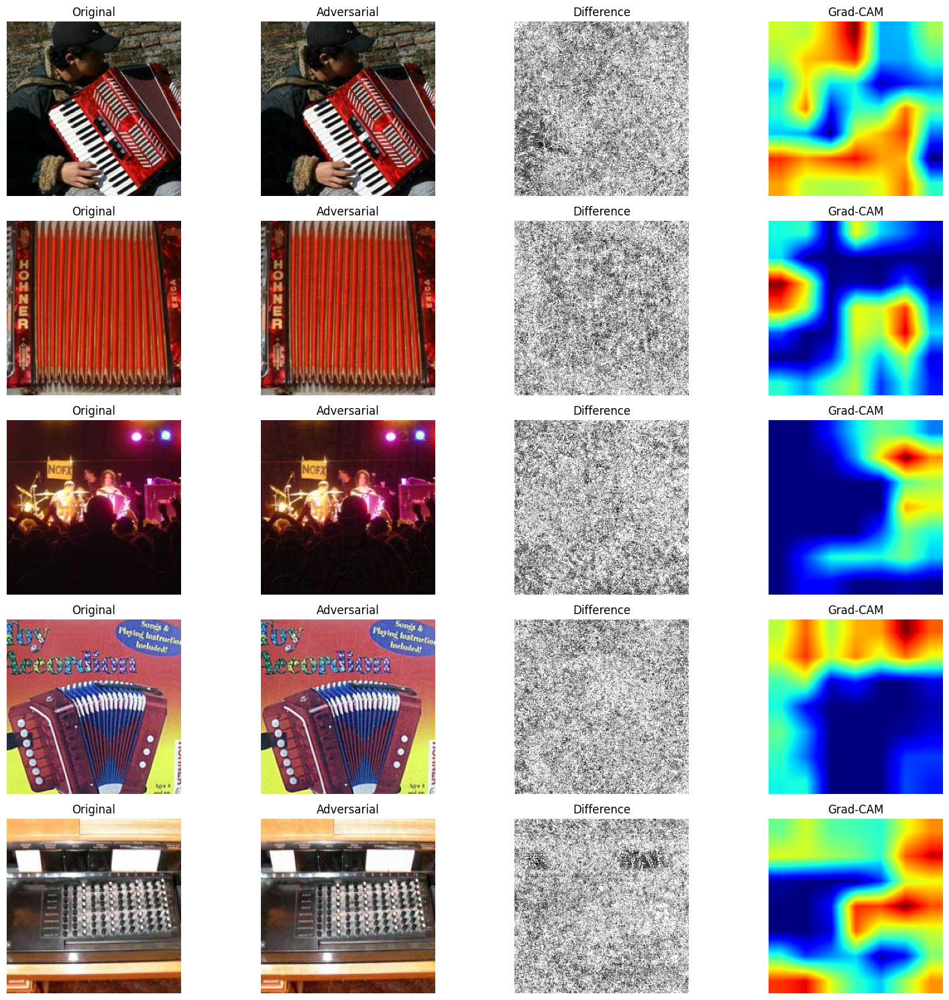

In [56]:
# Visualize comparison of the first 5 adversarial examples
visualize_adversarial_examples(origin_images, adv_images, cam_list)

# Task 4

In [59]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import os

# Store gradients and activations for Grad-CAM
gradients = []
activations = []

def register_gradcam_hooks(model, layer_name="layer4[1].conv2"):
    """
    Register forward and backward hooks to capture activations and gradients.

    Parameters:
        model: the neural network model
        layer_name (str): target layer in string format, e.g., 'layer4[1].conv2'

    Returns:
        handle_fwd, handle_bwd: hook handles that can be removed later
    """
    target_layer = eval(f"model.{layer_name}")

    def forward_hook(module, input, output):
        activations.append(output)

    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0])

    handle_fwd = target_layer.register_forward_hook(forward_hook)
    handle_bwd = target_layer.register_full_backward_hook(backward_hook)

    return handle_fwd, handle_bwd

def unnormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """
    Reverse ImageNet-style normalization, mapping tensor values back to [0, 1] for visualization.

    Parameters:
        tensor: normalized input tensor (B, C, H, W)
        mean: list of channel-wise mean values
        std: list of channel-wise std values

    Returns:
        tensor in [0, 1] range, suitable for display or saving
    """
    mean = torch.tensor(mean).view(1, 3, 1, 1).to(tensor.device)
    std = torch.tensor(std).view(1, 3, 1, 1).to(tensor.device)
    return torch.clamp(tensor * std + mean, 0, 1)


In [60]:
def PGD_Patch_GradCAM_Attack_Eval(
    model, dataloader, epsilon=0.3, alpha=0.005, steps=20,
    patch_size=32, save_dir="AdversarialTestSet3", device='cuda'
):
    model.eval()
    os.makedirs(save_dir, exist_ok=True)
    origin_images, adv_images, true_labels, cam_list = [], [], [], []

    correct_predictions = 0
    correct_predictions_top5 = 0
    total_samples = 0

    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    mean_tensor = torch.tensor(mean).view(1, 3, 1, 1).to(device)
    std_tensor = torch.tensor(std).view(1, 3, 1, 1).to(device)

    for idx, (images, labels) in tqdm(enumerate(dataloader), total=500, desc="PGD-Patch Attack"):
        images, labels = images.to(device), labels.to(device)
        labels += 401

        for i in range(images.size(0)):
            image = images[i].unsqueeze(0)
            label = labels[i].unsqueeze(0)

            gradients.clear()
            activations.clear()

            handle_fwd, handle_bwd = register_gradcam_hooks(model, layer_name="layer4[1].conv2")

            output = model(image)
            loss = F.cross_entropy(output, label)
            model.zero_grad()
            loss.backward()
            handle_fwd.remove()
            handle_bwd.remove()

            grad = gradients[0]
            act = activations[0]
            weights = torch.mean(grad, dim=(2, 3), keepdim=True)
            cam = torch.sum(weights * act, dim=1, keepdim=True)
            cam = F.relu(cam)
            cam = F.interpolate(cam, size=(224, 224), mode='bilinear', align_corners=False)
            cam = torch.sigmoid(cam * 10.0)
            cam_list.append(cam.detach().cpu())

            cam_np = cam[0, 0].detach().cpu().numpy()
            max_pos = np.unravel_index(np.argmax(cam_np), cam_np.shape)
            top = max(0, max_pos[0] - patch_size // 2)
            left = max(0, max_pos[1] - patch_size // 2)
            bottom = min(top + patch_size, 224)
            right = min(left + patch_size, 224)

            mask = torch.zeros_like(image)
            mask[:, :, top:bottom, left:right] = 1.0

            unnorm_image = unnormalize(image.clone())
            noise = (torch.rand_like(unnorm_image) * 2 - 1) * epsilon * 0.5
            x_adv = torch.clamp(unnorm_image + noise, 0, 1).detach()
            grad_accum = torch.zeros_like(x_adv)

            for _ in range(steps):
                x_adv.requires_grad_(True)
                B, C, H, W = x_adv.shape
                mean_expand = mean_tensor.expand(B, C, H, W)
                std_expand = std_tensor.expand(B, C, H, W)
                x_norm = (x_adv - mean_expand) / std_expand

                output = model(x_norm)
                true_logit = output.gather(1, label.unsqueeze(1)).squeeze()
                top2_logit = output.topk(2, dim=1)[0][:, 1]
                loss = (top2_logit - true_logit).mean()

                model.zero_grad()
                loss.backward()
                grad = x_adv.grad.data
                grad_accum = 0.9 * grad_accum + grad / (grad.view(B, -1).norm(p=1, dim=1).view(B, 1, 1, 1) + 1e-8)
                perturb = alpha * grad_accum.sign() * mask
                x_adv = x_adv + perturb
                x_adv = torch.max(torch.min(x_adv, unnorm_image + epsilon), unnorm_image - epsilon)
                x_adv = torch.clamp(x_adv, 0, 1).detach()

            x_norm = (x_adv - mean_tensor.expand_as(x_adv)) / std_tensor.expand_as(x_adv)
            with torch.no_grad():
                output_adv = model(x_norm)
                _, pred = torch.max(output_adv, 1)
                _, top5 = torch.topk(output_adv, 5, dim=1)
                correct_predictions += (pred == label).sum().item()
                correct_predictions_top5 += (top5 == label.unsqueeze(1)).any(dim=1).sum().item()
                total_samples += 1

            label_name = str(label.item())
            save_subdir = os.path.join(save_dir, label_name)
            os.makedirs(save_subdir, exist_ok=True)
            save_path = os.path.join(save_subdir, f"adv_{idx}_{i}.png")
            save_image(x_adv.squeeze(0).detach().cpu(), save_path)

            origin_images.append(unnorm_image.squeeze(0).detach().cpu())
            adv_images.append(x_adv.squeeze(0).detach().cpu())
            true_labels.append(label.item())

    acc1 = (correct_predictions / total_samples) * 100
    acc5 = (correct_predictions_top5 / total_samples) * 100
    print(f"\n[Patch-PGD+GradCAM] Top-1 Accuracy: {acc1:.2f}%")
    print(f"[Patch-PGD+GradCAM] Top-5 Accuracy: {acc5:.2f}%")

    return origin_images, adv_images, true_labels, cam_list


In [61]:
# Perform PGD Patch Attack guided by Grad-CAM (for Task 4)
def PGD_Patch_Task4_GradCAM(
    model, dataloader, epsilon=0.3, alpha=0.01, steps=40,
    patch_size=32, save_dir="Adversarial Test Set 3", device='cuda'
):
    import os
    from torchvision.utils import save_image
    from tqdm import tqdm

    model.eval()
    os.makedirs(save_dir, exist_ok=True)
    correct_top1, correct_top5, total = 0, 0, 0

    origin_images, adv_images, true_labels = [], [], []
    epsilon_record = []

    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    mean_tensor = torch.tensor(mean).view(1, 3, 1, 1).to(device)
    std_tensor = torch.tensor(std).view(1, 3, 1, 1).to(device)

    def register_hooks(model):
        grads, acts = [], []
        def fwd_hook(module, input, output):
            acts.append(output)
        def bwd_hook(module, grad_input, grad_output):
            grads.append(grad_output[0])
        h1 = model.layer4[1].conv2.register_forward_hook(fwd_hook)
        h2 = model.layer4[1].conv2.register_backward_hook(bwd_hook)
        return grads, acts, h1, h2

    for idx, (images, labels) in tqdm(enumerate(dataloader), total=len(dataloader), desc="PGD-Patch Task4 GradCAM"):
        images, labels = images.to(device), labels.to(device)
        labels += 401  # shift class index

        for i in range(images.size(0)):
            image = images[i].unsqueeze(0)
            label = labels[i].unsqueeze(0)

            # 1. Register hooks and get Grad-CAM
            grads, acts, h1, h2 = register_hooks(model)
            output = model(image)
            loss = F.cross_entropy(output, label)
            model.zero_grad()
            loss.backward()
            h1.remove(); h2.remove()

            grad = grads[0]
            act = acts[0]
            weights = torch.mean(grad, dim=(2, 3), keepdim=True)
            cam = torch.sum(weights * act, dim=1, keepdim=True)
            cam = F.relu(cam)
            cam = F.interpolate(cam, size=(224, 224), mode='bilinear', align_corners=False)
            cam = torch.sigmoid(cam * 10.0)

            # 2. Use Grad-CAM to locate the patch center
            cam_np = cam[0, 0].detach().cpu().numpy()
            max_pos = np.unravel_index(np.argmax(cam_np), cam_np.shape)
            top = max(0, max_pos[0] - patch_size // 2)
            left = max(0, max_pos[1] - patch_size // 2)
            bottom = min(top + patch_size, 224)
            right = min(left + patch_size, 224)

            mask = torch.zeros_like(image)
            mask[:, :, top:bottom, left:right] = 1.0

            # 3. PGD iteration with masked patch
            image_unnorm = unnormalize(image.clone(), mean, std)
            x_adv = image_unnorm + (torch.rand_like(image_unnorm) * 2 - 1) * epsilon * 0.1
            x_adv = torch.clamp(x_adv, 0, 1).detach()
            grad_accum = torch.zeros_like(x_adv)

            for _ in range(steps):
                x_adv.requires_grad_(True)
                x_norm = (x_adv - mean_tensor) / std_tensor
                output = model(x_norm)
                loss = F.cross_entropy(output, label)
                model.zero_grad()
                loss.backward()
                grad = x_adv.grad.detach()
                grad_accum = 0.9 * grad_accum + grad / (grad.view(1, -1).norm(p=1) + 1e-8).view(1, 1, 1, 1)
                perturb = alpha * grad_accum.sign() * mask
                x_adv = x_adv + perturb
                x_adv = torch.max(torch.min(x_adv, image_unnorm + epsilon), image_unnorm - epsilon)
                x_adv = torch.clamp(x_adv, 0, 1).detach()

            # 4. Evaluate and save result
            x_adv_norm = (x_adv - mean_tensor) / std_tensor
            with torch.no_grad():
                output = model(x_adv_norm)
                _, pred = output.max(1)
                _, top5 = torch.topk(output, 5, dim=1)
                correct_top1 += (pred == label).sum().item()
                correct_top5 += (top5 == label.unsqueeze(1)).any(dim=1).sum().item()
                total += 1

            label_name = str(label.item())
            class_dir = os.path.join(save_dir, label_name)
            os.makedirs(class_dir, exist_ok=True)
            save_path = os.path.join(class_dir, f"adv_{idx}_{i}.png")
            save_image(x_adv.squeeze(0).cpu(), save_path)

            origin_images.append(image_unnorm.squeeze(0).cpu())
            adv_images.append(x_adv.squeeze(0).cpu())
            true_labels.append(label.item())

            # 5. Record epsilon statistics
            max_eps = (x_adv - image_unnorm).abs().max().item()
            mean_eps = (x_adv - image_unnorm).abs().mean().item()
            epsilon_record.append((max_eps, mean_eps))

    acc1 = 100.0 * correct_top1 / total
    acc5 = 100.0 * correct_top5 / total
    print(f"\n[Task4-PGD Patch (GradCAM)] Top-1 Accuracy: {acc1:.2f}%")
    print(f"[Task4-PGD Patch (GradCAM)] Top-5 Accuracy: {acc5:.2f}%")

    epsilons = torch.tensor(epsilon_record)
    print(f"[Epsilon Info] Max perturbation: {epsilons[:,0].max():.5f}")
    print(f"[Epsilon Info] Mean perturbation: {epsilons[:,1].mean():.5f}")

    return origin_images, adv_images, true_labels


In [72]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_pgd_patch_results(orig_images, adv_images, cam_list, true_labels, num_samples=5):
    """
    Visualize PGD Patch attack results, including the patch position and Grad-CAM heatmap.

    Parameters:
        orig_images: list of tensors [3, H, W] - original images
        adv_images: list of tensors [3, H, W] - adversarial images
        cam_list: list of heatmaps [1, H, W] - Grad-CAM outputs
        true_labels: list of int - ground truth class labels
        num_samples: int - number of samples to visualize
    """
    for i in range(min(num_samples, len(orig_images))):
        # Convert tensors to NumPy arrays
        orig_np = orig_images[i].permute(1, 2, 0).numpy()
        adv_np = adv_images[i].permute(1, 2, 0).numpy()
        diff_np = np.abs(orig_np - adv_np)

        # Normalize difference image to [0, 1] for visibility
        diff_np = diff_np / (diff_np.max() + 1e-8)

        # Normalize Grad-CAM for display (even if original was sigmoid)
        cam_np = cam_list[i].squeeze().numpy()
        cam_np = (cam_np - cam_np.min()) / (cam_np.max() + 1e-8)
        cam_color = plt.cm.jet(cam_np)[..., :3]

        # Determine patch location from CAM max point
        max_pos = np.unravel_index(np.argmax(cam_np), cam_np.shape)
        top = max(0, max_pos[0] - 16)
        left = max(0, max_pos[1] - 16)
        bottom = min(top + 32, 224)
        right = min(left + 32, 224)

        # Plot
        fig, axs = plt.subplots(1, 4, figsize=(16, 4))
        axs[0].imshow(orig_np)
        axs[0].set_title("Original")

        axs[1].imshow(adv_np)
        axs[1].set_title("Adversarial")

        axs[2].imshow(diff_np)
        axs[2].set_title("Difference")

        axs[3].imshow(cam_color)
        axs[3].set_title("Grad-CAM")

        for ax in axs:
            ax.add_patch(plt.Rectangle((left, top), right-left, bottom-top,
                                       edgecolor='red', linewidth=2, fill=False))
            ax.axis("off")

        plt.suptitle(f"Sample {i} | True Label: {true_labels[i]}", fontsize=14)
        plt.tight_layout()
        plt.show()


In [65]:

origin_images, adv_images, true_labels, cam_list = PGD_Patch_GradCAM_Attack_Eval(
    model=pretrained_model,
    dataloader=test_loader,
    save_dir="AdversarialTestSet3",
    device=device
)

PGD-Patch Attack: 100%|██████████| 500/500 [02:43<00:00,  3.05it/s]


[Patch-PGD+GradCAM] Top-1 Accuracy: 32.40%
[Patch-PGD+GradCAM] Top-5 Accuracy: 74.20%


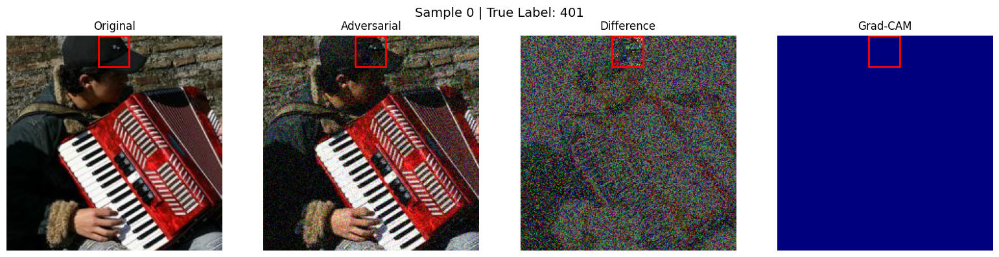

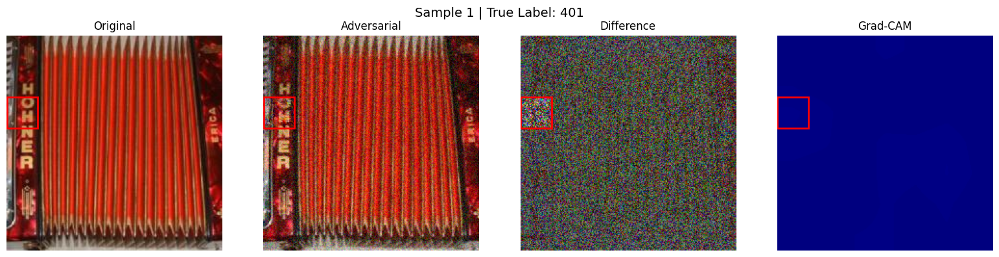

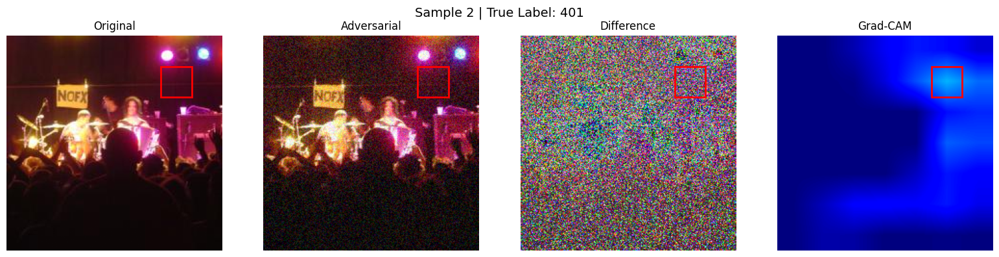

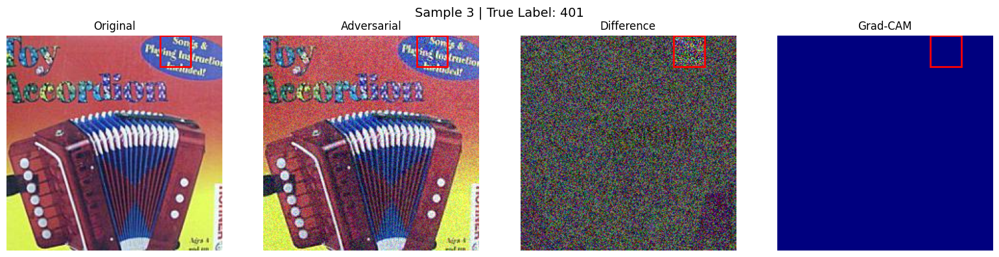

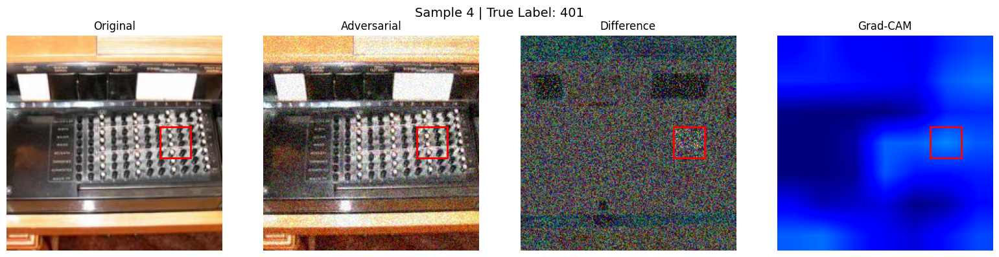

In [73]:
# Visualize the first 5 adversarial examples and their corresponding Grad-CAM patches
visualize_pgd_patch_results(origin_images, adv_images, cam_list, true_labels, num_samples=5)

# Task 5

In [74]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torch.nn.functional as F
import numpy as np
from tqdm import tqdm


In [75]:
# Define normalization parameters (ImageNet standard)
mean_norms = [0.485, 0.456, 0.406]
std_norms = [0.229, 0.224, 0.225]

# Image transformation: Convert to tensor and normalize
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# Define dataset folders for original and adversarial examples
dataset_paths = {
    "Original": "TestDataSet",            # Original clean images
    "Adv1": "AdversarialTestSet1",        # Adversarial set from Task 1
    "Adv2": "AdversarialTestSet2",        # Adversarial set from Task 2
    "Adv3": "AdversarialTestSet3"         # Adversarial set from Task 3/4
}

In [76]:
def evaluate_model(model, dataloader, device):
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(dataloader):
            images, labels = images.to(device), labels.to(device)
            labels+=401
            outputs = model(images)
            _, pred_top1 = outputs.topk(1, dim=1)
            _, pred_top5 = outputs.topk(5, dim=1)

            correct_top1 += (pred_top1.squeeze() == labels).sum().item()
            correct_top5 += sum([labels[i] in pred_top5[i] for i in range(labels.size(0))])
            total += labels.size(0)

    top1 = 100 * correct_top1 / total
    top5 = 100 * correct_top5 / total
    return top1, top5


In [77]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_name = "densenet121"

new_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
new_model = new_model.to(device)
new_model.eval()


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 154MB/s]


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [78]:
results = {}

for name, path in dataset_paths.items():
    dataset = ImageFolder(root=path, transform=transform)
    loader = DataLoader(dataset, batch_size=32, shuffle=False)
    top1, top5 = evaluate_model(new_model, loader, device)
    results[name] = (top1, top5)
    print(f"{name} — Top-1: {top1:.2f}%, Top-5: {top5:.2f}%")


100%|██████████| 16/16 [00:01<00:00, 13.23it/s]


Original — Top-1: 74.60%, Top-5: 93.60%


100%|██████████| 16/16 [00:01<00:00,  8.58it/s]


Adv1 — Top-1: 64.80%, Top-5: 89.80%


100%|██████████| 16/16 [00:01<00:00,  8.57it/s]


Adv2 — Top-1: 52.20%, Top-5: 79.40%


100%|██████████| 16/16 [00:01<00:00, 10.27it/s]

Adv3 — Top-1: 63.40%, Top-5: 84.80%


          Top-1  Top-5
Original   74.6   93.6
Adv1       64.8   89.8
Adv2       52.2   79.4
Adv3       63.4   84.8


<Axes: title={'center': 'Transferability on DenseNet121'}>

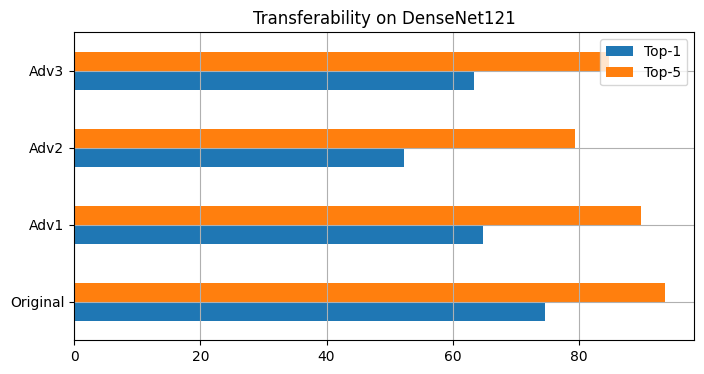

In [80]:
import pandas as pd

df = pd.DataFrame(results, index=["Top-1", "Top-5"]).T
print(df)

df.plot(kind='barh', title="Transferability on DenseNet121", figsize=(8,4), grid=True)
